# Analyze global equilibrium runs

Imports: 

In [1]:
import os
import copy
import numpy as np
import xarray as xr
import pandas as pd
import plot_gcm
import importlib
import dask
from dask.diagnostics import ProgressBar

from cycler import cycler
import matplotlib as mpl
from matplotlib import colors
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator


dask.config.set({"array.slicing.split_large_chunks": False})

# create cmap
color_list=[colors.to_rgb('#'+c) for c in ["001219","003946","005f73","0a9396","4fb3aa","94d2bd","e9d8a6","ecba53","ee9b00","dc8101","bb3e03","8d210c","5e0314"]]
gcm_cmap = cmap = mpl.colors.ListedColormap(color_list)
custom_cycler = cycler(color=gcm_cmap.colors)

## 1. Read the Data
Reads the output data from the global run. For each region a file named eg. `01_equilibrium.nc` was written. Those files are read in parallel and joined together.


In [3]:
READING_DIR='out/run_CMIP6_geod'

# read geodetic output
with ProgressBar():
    p = os.path.join(READING_DIR,'*_equilibrium.nc')
    all_ds = xr.open_mfdataset(p, parallel=True)

[########################################] | 100% Completed |  0.5s


The output is an xarray Dataset with 3 coordinates (rgi_id, gcm and year). Note, that this data isn't filtered yet and include incomplete data and wuite many Nan values.

In [4]:
all_ds

<xarray.Dataset>
Dimensions:           (rgi_id: 205699, gcm: 14, year: 154)
Coordinates:
  * rgi_id            (rgi_id) object 'RGI60-01.00001' ... 'RGI60-18.03537'
  * gcm               (gcm) object 'CRU' 'CanESM5' ... 'MIROC6'
  * year              (year) int64 1866 1867 1868 1869 ... 2016 2017 2018 2019
Data variables:
    equilibrium       (rgi_id, gcm, year) float64 dask.array<chunksize=(25905, 14, 154), meta=np.ndarray>
    equilibrium_area  (rgi_id, gcm, year) float64 dask.array<chunksize=(25905, 14, 154), meta=np.ndarray>
    run_time          (rgi_id, gcm, year) float64 dask.array<chunksize=(25905, 14, 154), meta=np.ndarray>
Attributes:
    description:    OGGM model output
    oggm_version:   1.5.3.dev14+g25c4675
    calendar:       365-day no leap
    creation_date:  2022-01-28 03:14:54

All simulations were performed with 13 gcms and with CRU. Nevertheless, it turned out that 5 of these gcm were identified as "too-hot" models based on their TCR value and thus we exclude them for our analysis. 

In [8]:
# all 13 gcms+CRU
# order=['CanESM5', 'NorESM2-MM', 'FGOALS-f3-L','BCC-CSM2-MR', 'MRI-ESM2-0','MPI-ESM1-2-HR','ACCESS-CM2', 'EC-Earth3', 'MIROC6','CESM2','GISS-E2-2-H','IPSL-CM6A-LR-INCA','E3SM-1-1','CRU']

# list of gcms that exclude the "too-hot" models
order = ['FGOALS-f3-L', 'BCC-CSM2-MR', 'MRI-ESM2-0', 'MPI-ESM1-2-HR', 'ACCESS-CM2', 'MIROC6', 'CESM2', 'GISS-E2-2-H','CRU']
all_ds = all_ds.reindex(gcm=order).equilibrium

## 2. Filter errors
A first attempt was to remove all glaciers completely, if it fails in one of the 14 gcms. This turned out to be to strict as our analysis would cover less than 50% of the worlds glacier volume. 
Thus, we only filter out incomplete time series and accept that the comparison between the different gcms needs to be handled carefully as not all glaciers are included in all gcms. 

In [9]:
ds = xr.concat([all_ds.sel(gcm=gcm).dropna(dim='year',how='all').dropna(dim='rgi_id',how='any') for gcm in all_ds.gcm.values],dim='gcm')
ds = ds.assign_coords({"region": ds.rgi_id.str[6:8]})

In [12]:
ds

,Array,Chunk
Bytes,2.06 GiB,59.81 MiB
Shape,"(9, 199919, 154)","(1, 50903, 154)"
Count,1806 Tasks,162 Chunks
Type,float64,numpy.ndarray


## 3. Plots & Analysis

We calculate the sum over all glaciers per region and globally in order to avoid to recalcultate it again and again ...

In [27]:
ds_sum = xr.concat([ds.groupby('region').sum(min_count=1)]+[ds.sum(dim='rgi_id', min_count=1).assign_coords({"region": 'global'})], dim='region')
ds_sum

,Array,Chunk
Bytes,205.73 kiB,1.20 kiB
Shape,"(9, 19, 154)","(1, 1, 154)"
Count,4929 Tasks,171 Chunks
Type,float64,numpy.ndarray


In order to get an impression of how much ice volume covered in our runs, we take the itmix volume of all galciers into account. We calculate the volume percentage of the sucessfully modeled glaciers per gcm and region (and globally). 

In [28]:
def itmix_sucess_percentage(itmix, ds, all_ds, order=None): 
    itmix_df = pd.DataFrame()
    for gcm in ds.gcm.values:
        itmix_d = itmix.loc[ds.sel(gcm=gcm).dropna(dim='year', how='all').dropna(dim='rgi_id',how='any').rgi_id.values]
        itmix_p = (itmix_d.groupby(by='O1Region').vol_itmix_km3.sum()/itmix.loc[all_ds.rgi_id.values].groupby(by='O1Region').vol_itmix_km3.sum())*100
        itmix_p.loc['global']=(itmix_d.vol_itmix_km3.sum()/itmix.loc[all_ds.rgi_id.values].vol_itmix_km3.sum())*100
        itmix_df.loc[:,gcm]=itmix_p
    # convert region number to str with 2 digits
    itmix_df.index = itmix_df.index.astype(str).str.zfill(2)
    if order!=None:
        itmix_df = itmix_df[order]
    return itmix_df

In [29]:
itmix = pd.read_csv('rgi62_itmix.csv',index_col='RGIId')
itmix_df = itmix_sucess_percentage(itmix, ds, all_ds, order)

The table can be displayed colored by values:

In [30]:
itmix_df.style.background_gradient(cmap='PuBu').format(precision=1)

,FGOALS-f3-L,BCC-CSM2-MR,MRI-ESM2-0,MPI-ESM1-2-HR,ACCESS-CM2,MIROC6,CESM2,GISS-E2-2-H,CRU
O1Region,,,,,,,,,
01,61.9,89.2,89.2,83.4,65.8,61.2,89.2,87.1,63.5
02,99.9,99.9,99.9,99.9,99.9,99.9,99.9,99.9,99.9
03,40.1,41.5,43.1,36.4,38.0,33.0,43.7,31.8,41.8
04,83.8,79.3,76.6,77.7,79.4,67.4,81.3,78.6,81.1
05,79.1,78.8,80.5,76.2,77.0,78.0,80.0,74.1,82.2
06,36.3,81.4,35.8,22.6,35.7,35.9,40.3,42.9,100.0
07,7.9,8.7,8.8,4.4,8.4,8.1,10.1,7.0,9.4
08,96.2,96.1,99.9,93.0,96.0,93.3,99.9,96.0,99.9
09,5.8,9.0,8.9,8.5,8.8,9.3,11.9,7.2,13.5


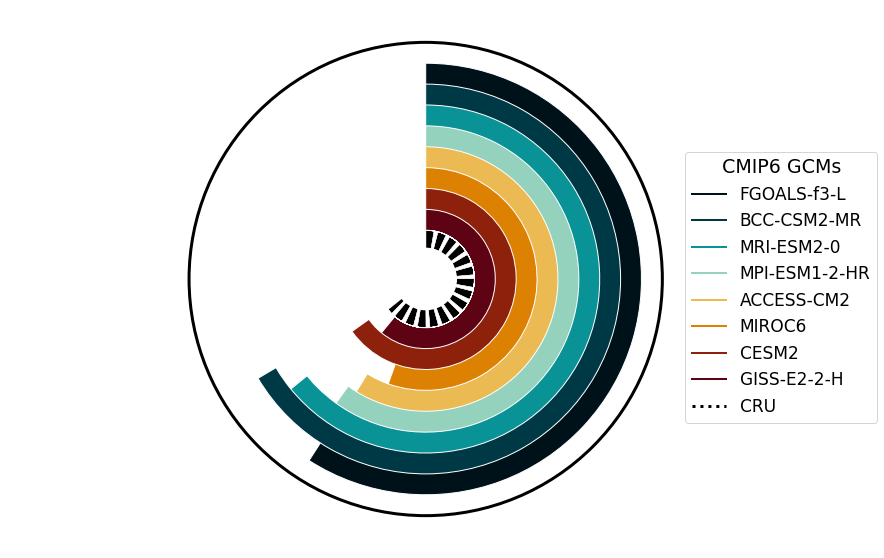

In [32]:
from matplotlib.lines import Line2D
importlib.reload(plot_gcm)
cmap=plot_gcm.create_gcm_cmap(8)
ax = plot_gcm.plot_donut(itmix_df, 'global', cmap=cmap, p=100)

custom_lines =[Line2D([0], [0], color=cmap(i), lw=2) for i,gcm in enumerate(itmix_df.columns[:-1])]+[Line2D([0], [0], color='k',linestyle=':', lw=3)]
leg = ax.legend(custom_lines, itmix_df.columns,fontsize=17,bbox_to_anchor=(0.8,0.75))
leg.set_title('CMIP6 GCMs',prop={'size':19});

plt.savefig(os.path.join('out','run_CMIP6_geod','plots','itmix.png'),dpi=300);

### 3.1. Equilibrium Glacier Volume (km$^3$)
#### Globally

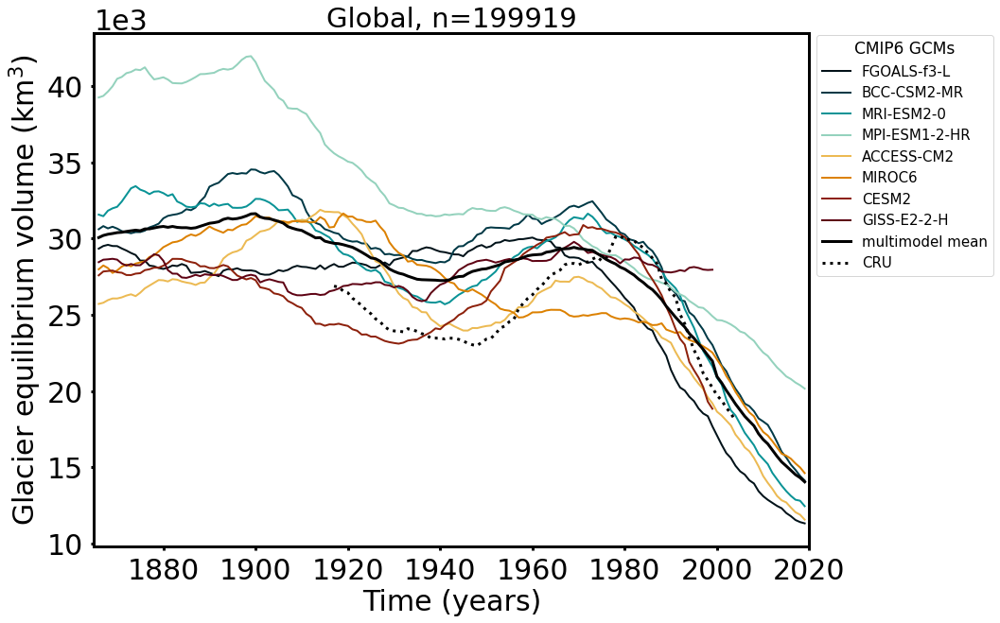

In [62]:
importlib.reload(plot_gcm)

fig = plt.figure(figsize=(15,10))
fig.patch.set_facecolor('white')
grid = plt.GridSpec(1,1,left=0.1,right=0.8)
ax = fig.add_subplot(grid[0])

plot_gcm.plot_volume_km3(ds_sum,'global', n=len(ds.rgi_id.values), ax=ax)
plt.savefig(os.path.join('out','run_CMIP6_geod','plots','global','global_volume_km3.png'),dpi=300);

By additionally passing the itmix_df to the plot_volume_km3 function, the donut pie with the volume percentages of each gcm is automatically added to the plot.

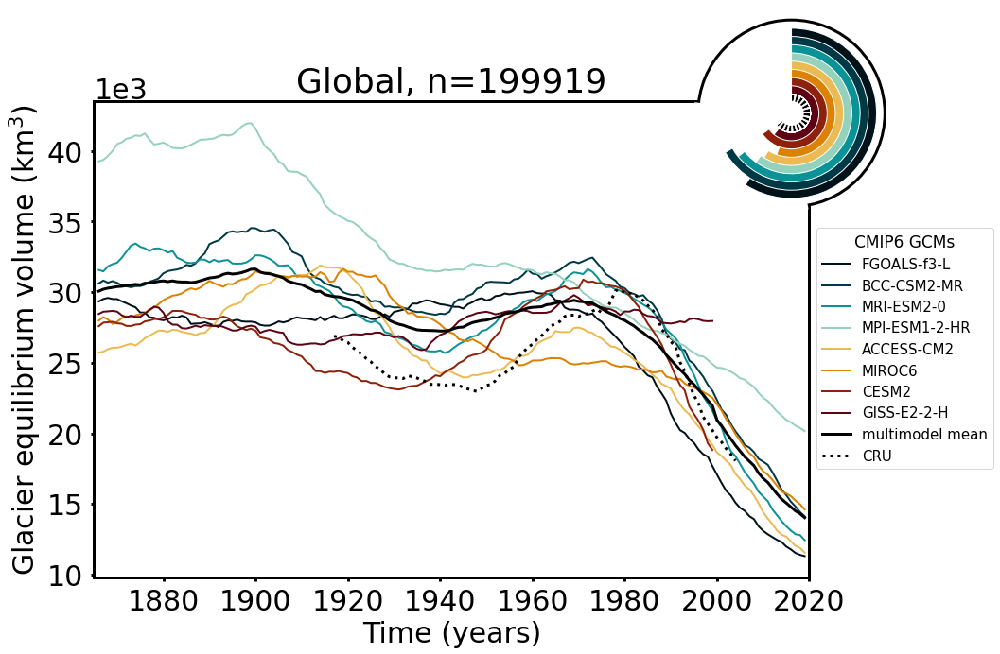

In [63]:
importlib.reload(plot_gcm)

fig = plt.figure(figsize=(15,10))
fig.patch.set_facecolor('white')
grid = plt.GridSpec(1,1,left=0.1,right=0.8, top=0.825)
ax = fig.add_subplot(grid[0])

plot_gcm.plot_volume_km3(ds_sum,'global', n=len(ds.rgi_id.values), ax=ax, itmix_df=itmix_df)
plt.savefig(os.path.join('out','run_CMIP6_geod','plots','global','global_itmix_volume_km3.png'),dpi=300);

#### Regionally

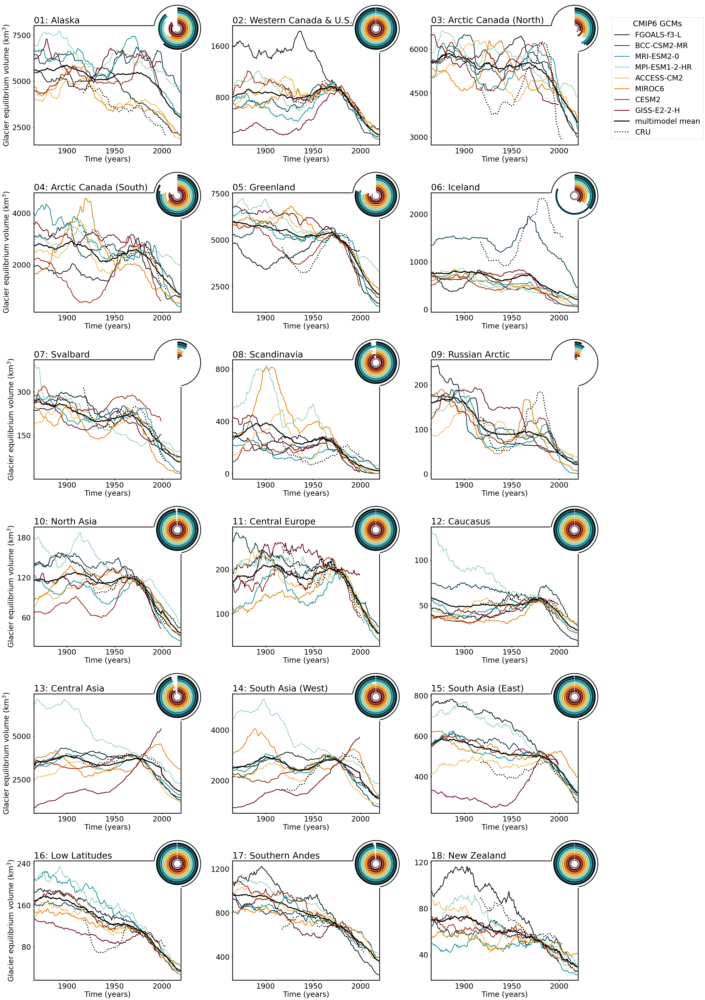

In [64]:
importlib.reload(plot_gcm)
plot_gcm.plot_regional_volume_km3_donut(ds_sum, itmix_df);

## 3.1 Sea level contribution 

In [65]:
def convert_km3_to_sle(ds): 
    # convert to mass (Gt)
    mass = ds*0.9167
    # convert to sle
    sle = mass*(1 / 361.8)
    return sle    

Calculate the ice mass loss relative to 1998 (the last year with data coverage from all gcms)

In [66]:
ds_dt = ds_sum-ds_sum.sel(year=1998).reindex(gcm=order)
sle_dt = convert_km3_to_sle(-ds_dt)

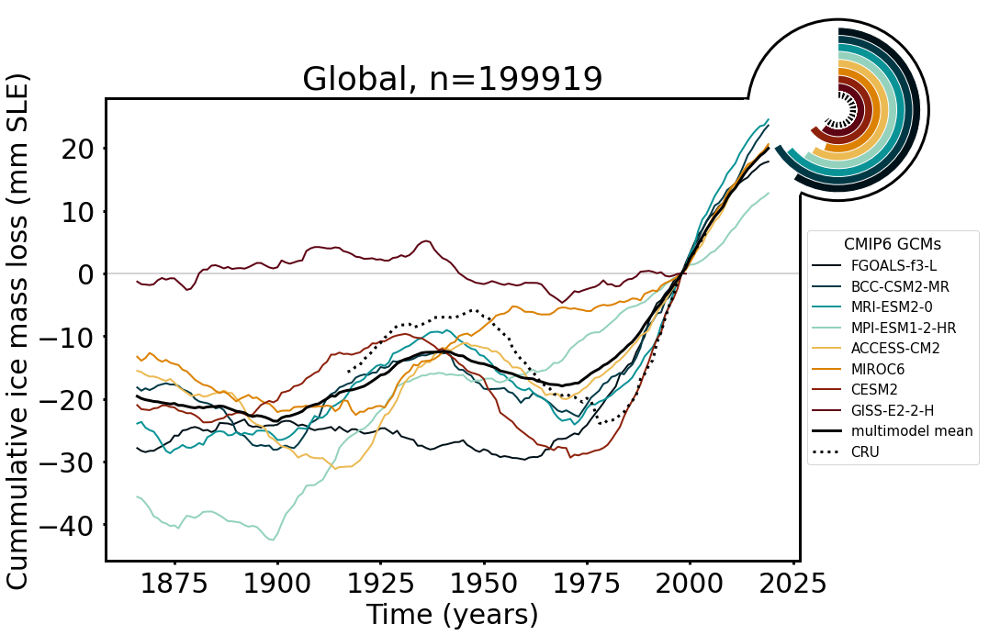

In [75]:
importlib.reload(plot_gcm)

fig = plt.figure(figsize=(15,10))
fig.patch.set_facecolor('white')
grid = plt.GridSpec(1,1,left=0.1,right=0.8, top=0.825)
ax = fig.add_subplot(grid[0])

plot_gcm.plot_mass_loss_sle(sle_dt, 'global', itmix_df=itmix_df, n=len(ds.rgi_id), ax=ax, add_legend=True,lw=2);
plt.savefig(os.path.join('out','run_CMIP6_geod','plots','global_itmix_sle.png'),dpi=300)

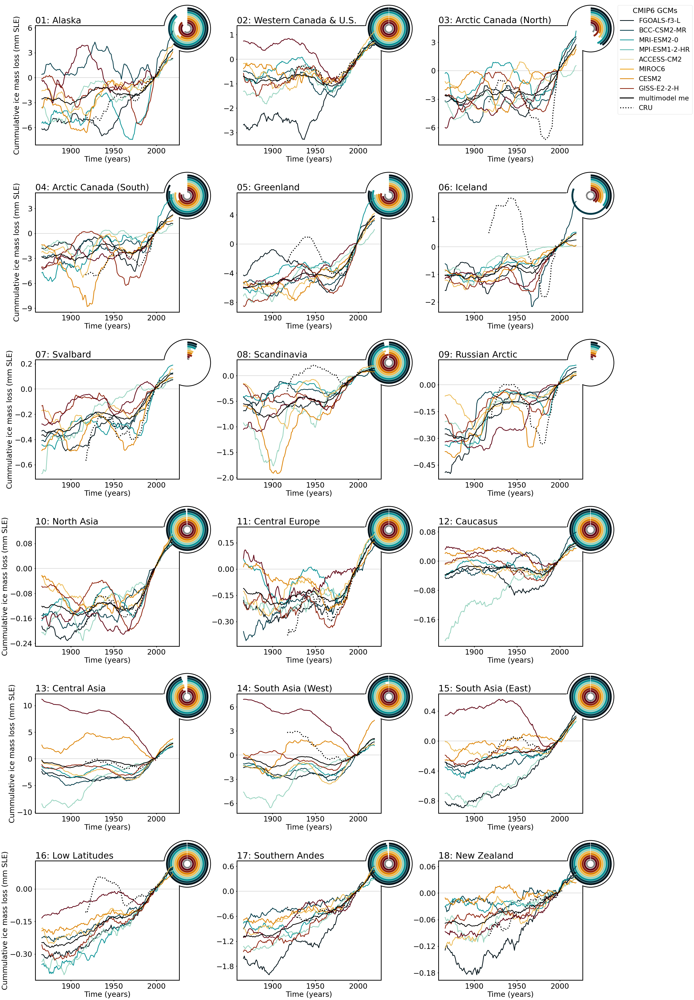

In [79]:
importlib.reload(plot_gcm)

fig = plt.figure(figsize=(40,60))
fig.patch.set_facecolor('white')
grid = plt.GridSpec(6,3, hspace=0.4, wspace=0.4,left=0.05,right=0.825,top=0.95,bottom=0.05)
    
for i,grid_index in enumerate(range(1,19)):
    reg = str(i+1).zfill(2)
    ax = fig.add_subplot(grid[grid_index-1])

    plot_gcm.plot_mass_loss_sle(sle_dt, reg, itmix_df=itmix_df, ax=ax, add_legend=False, lw=3)
    ax.yaxis.set_major_locator(MaxNLocator(5))
    if reg not in [str(i).zfill(2) for i in range(1,19,3)]:
        ax.set_ylabel('')

#legend
ax0 = fig.add_subplot(grid[2])
ax0, _= plot_gcm.show_legend(np.insert(ds.gcm.values,-1,'multimodel mean'), ax=ax0, bbox_to_anchor=(1.785,1.2), fontsize=27, lw=3);
ax0.set_axis_off()
plt.savefig(os.path.join('out','run_CMIP6_geod','plots','regional_itmix_sle.pdf'),dpi=300)

## 4. Upscaling of missing glaciers
As many glaciers are missing, we will try to upscale them , such that we might get a better global picture. 
But first, we will try to get a better picture of distribution of the missing glaciers.

In [82]:
# add region to coordinates for a better selection
all_ds = all_ds.assign_coords({"region": all_ds.rgi_id.str[6:8]})
ds = ds.assign_coords({"region": ds.rgi_id.str[6:8]})

#### Interpolation of missing values
##### a) Incomplete time series
Until here, we only considered complete time series and droped a gcm for a glacier in case the data is uncomplete (any Nan values over time). As, we now want to upscale the missing glaciers, we will reconsider this incomplete data. A bit of knowledge is better than no knowledge. For a better understanding, we demonstrate this on an example on one of the gcms: 

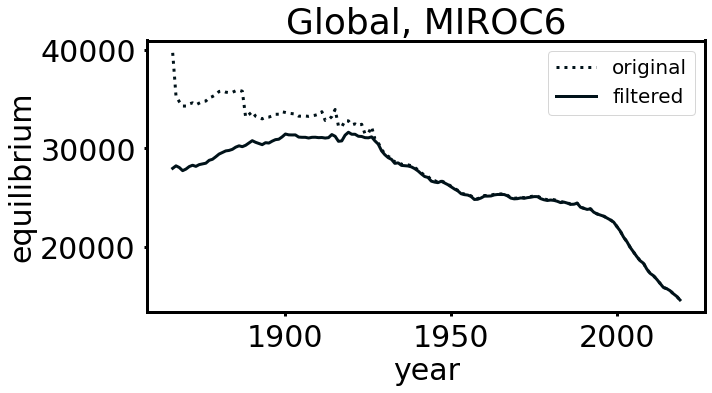

In [87]:
fig,ax = plt.subplots(1,1, figsize=(10,5))
cmap=plot_gcm.create_gcm_cmap()
all_ds.sel(gcm='MIROC6').sum(dim='rgi_id').plot(color=cmap(0), linestyle=':', label='original')
ds.sel(gcm='MIROC6').sum(dim='rgi_id').plot(color=cmap(0), label='filtered')
plt.title('Global, MIROC6')
plt.legend();

The jump at the beginning of the time series shows that most glaciers were droped out at the beginning. Nevertheless, some glaciers failed much later (the last one around 1980).
In a first step, we try to interpolate the data of the glaciers that have an incomplete time series. For each of those cases, the equilibrium volume at the beginning is known. That's why we will not interpolate the volume directly. We will first calculate the volume change over time, interpolate missing data of volume change with those of glaciers with a similar volume. To that, we will consider the itmix volume estimate of all glaciers and use the slinear interpolation method (distance weighted itmix volume). In the last step, we will recalculate to the equilibrium volume (in km³). 

In [88]:
dt_ds = xr.concat([all_ds.drop_sel(gcm='CRU')-all_ds.sel(year=1866).drop_sel(gcm='CRU'),
                  all_ds.sel(gcm='CRU')-all_ds.sel(year=1917).sel(gcm='CRU')],dim='gcm')

This function, selects a region and one gcm, convert the data to a pandas dataframe, add the information about the itmix volume to each glacier and apply the interpolation (based on distance weight of the itmix volume) and the recreates an xarray Dataset.  

In [89]:
def interpolate_change(ds, itmix, region, gcm):
    ds = ds.sel(rgi_id=ds.region==region, gcm=gcm).dropna(dim='year',how='all').dropna(dim='rgi_id', how='all')
    df = ds.to_pandas()
    
    # subset of glaciers with incomplete time series
    sub_df = df[df.isna().sum(axis=1)!=0]
    # filter outliers from these glaciers
    sub_df = sub_df[sub_df.sub(df.mean(axis=1), axis=0).le(3*sub_df.std(axis=1), axis=0)]
    # merge glaciers with complete time series with filtered (incomplete) glaciers together
    df = pd.concat([df[df.isna().sum(axis=1)==0],sub_df]).sort_index()
    
    df.loc[:,'itmix']=itmix.loc[df.index,'vol_itmix_km3']
    df.loc[:,'rgi_id']=df.index
    # slinear is distance weighted interpolation, limit_area=inside means no explapolation
    df = df.set_index('itmix').interpolate(axis=0, method='slinear', limit_area='inside').set_index('rgi_id')
    # create xarray dataset
    ds = xr.Dataset()

    # Coordinates
    ds.coords['rgi_id'] = ('rgi_id', df.index)
    ds['rgi_id'].attrs['description'] = 'RGI glacier identifier'
    ds.coords['year'] = ('year', df.columns)
    ds = ds.assign_coords({"year":ds.year.astype(int)})
    ds['year'].attrs['description'] = 'central year of random climate used to create the equilibrium glacier'
    
    
    # Variables
    ds['change'] = (('rgi_id', 'year'), df.values)
    ds = ds.assign_coords({'gcm': gcm,'region':region})

    return ds.sel(rgi_id=sub_df.index)

We apply this function for each gcm and for each region and remerge all data to an xr.Dataset with the data structure used before. 

In [90]:
change_ds = xr.concat([xr.concat([interpolate_change(dt_ds, itmix, str(reg).zfill(2), gcm).dropna(dim='rgi_id',how='any').change for gcm in all_ds.gcm.values], dim='gcm') 
                    for reg in range(1,19)], dim='rgi_id')  

Now, we recalculate the volume time series with the first year and the interpolated glacier changes. 

In [91]:
i_ds = xr.concat([change_ds.drop_sel(gcm='CRU')+all_ds.sel(rgi_id=change_ds.rgi_id, year=1866).drop_sel(gcm='CRU'),
           change_ds.sel(gcm='CRU')+all_ds.sel(rgi_id=change_ds.rgi_id, year=1917, gcm='CRU')], dim='gcm')
# makes sure that no negative values occur after interpolation (clipped to 0)
i_ds = i_ds.where((i_ds > 0)|i_ds.isnull(), 0)

In [92]:
i_sum = xr.concat([i_ds.groupby('region').sum(min_count=1)]+[i_ds.sum(dim='rgi_id', min_count=1).assign_coords({"region": 'global'})], dim='region')

In [93]:
itmix_df2 = itmix_sucess_percentage(itmix, i_ds, all_ds, order)

Before interpolation, we need to apply a filter to the incomplete time series. For some glaciers no equilibrium can be found. Due to cold and wet climate conditions the glacier is permanent gaining mass and due to the missing calving once the glacier reaches the ocean the glacier volume divierge until the simulation fails. To this end, we filter all years with values larger than the mean+- 3*std 

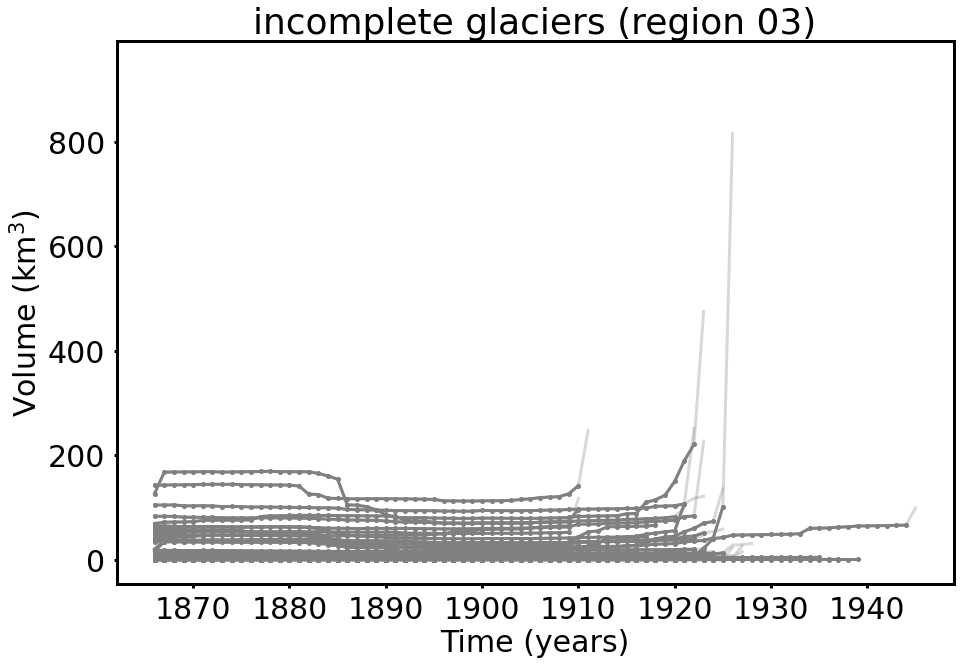

In [97]:
ax=plt.gca()
ids = i_ds.sel(rgi_id=i_ds.region=='03').sel(gcm='MIROC6').dropna(dim='rgi_id', how='any').rgi_id.values
df = all_ds.sel(rgi_id=ids, gcm='MIROC6').to_pandas()
# subset of glaciers with incomplete time series
sub_df = df[df.isna().sum(axis=1)!=0]
# filter outliers from these glaciers
sub_df = sub_df[sub_df.sub(df.mean(axis=1), axis=0).le(3*sub_df.std(axis=1), axis=0)]

df.T.plot(legend=False, ax=ax, alpha=0.3, color='grey');
sub_df.T.plot(legend=False, ax=ax, marker='o', markersize=4, color='grey');

ax.set_title('incomplete glaciers (region 03)')
ax.set_xlabel('Time (years)')
ax.set_ylabel(r'Volume (km$^3$)');
plt.savefig(os.path.join('out','run_CMIP6_geod','plots','example_incomplete.png'),dpi=300)

##### b) Interpolation of glaicers that failed at the beginning already 

In [99]:
# get the dimension of each gcm
year_dim = {gcm:all_ds.isel(rgi_id=0).sel(gcm=gcm).dropna(dim='year', how='all').shape[0] for gcm in all_ds.gcm.values}

In [100]:
def get_nan_ids(ds, gcm, year_dim):
    all_nan_id = ds.sel(gcm=gcm).dropna(dim='year', how='all').isnull().sum(dim='year').values==year_dim[gcm]
    return ds.sel(gcm=gcm, rgi_id=all_nan_id)

def interpolate_nan(ds, itmix, region, gcm):
    ds = ds.sel(gcm=gcm).sel(rgi_id=ds.region==region).dropna(dim='year',how='all')
    df = ds.to_pandas()
    
    # only keep complete or fully incomplete rgi_ids
    df = df[df.isna().sum(axis=1).isin([0,year_dim[gcm]])]
    # get index of nan rows
    nan_index = df[df.isna().any(axis=1)].index
    
    df.loc[:,'itmix']=itmix.loc[df.index,'vol_itmix_km3']
    df.loc[:,'rgi_id']=df.index
    # slinear is distance weighted interpolation, limit_area=inside means no explapolation
    df = df.set_index('itmix').interpolate(axis=0, method='slinear', limit_area='inside').set_index('rgi_id')
    
    # create xarray dataset
    ds = xr.Dataset()

    # Coordinates
    ds.coords['rgi_id'] = ('rgi_id', df.index)
    ds['rgi_id'].attrs['description'] = 'RGI glacier identifier'
    ds.coords['year'] = ('year', df.columns)
    ds = ds.assign_coords({"year":ds.year.astype(int)})
    ds['year'].attrs['description'] = 'central year of random climate used to create the equilibrium glacier'
    
    # Variables
    ds['equilibrium'] = (('rgi_id', 'year'), df.values)
    ds = ds.assign_coords({'gcm': gcm,'region':region})

    return ds.sel(rgi_id=nan_index)

In [101]:
i_nan_ds = xr.concat([xr.concat([interpolate_nan(all_ds, itmix, str(reg).zfill(2), gcm).dropna(dim='rgi_id',how='any') for gcm in all_ds.gcm.values], dim='gcm') 
                    for reg in range(1,19)], dim='rgi_id')  

In [102]:
itmix_df3 = itmix_sucess_percentage(itmix, i_nan_ds, all_ds, order)

In [103]:
nan_sum = xr.concat([i_nan_ds.groupby('region').sum(min_count=1)]+[i_nan_ds.sum(dim='rgi_id', min_count=1).assign_coords({"region": 'global'})], dim='region')

In [106]:
merge_ds = xr.merge([ds,i_ds.to_dataset(name='equilibrium'),i_nan_ds]).equilibrium

In [107]:
merge_ds

<xarray.DataArray 'equilibrium' (gcm: 9, rgi_id: 205646, year: 154)>
dask.array<where, shape=(9, 205646, 154), dtype=float64, chunksize=(8, 52048, 154), chunktype=numpy.ndarray>
Coordinates:
  * rgi_id   (rgi_id) object 'RGI60-01.00001' ... 'RGI60-18.03537'
  * year     (year) int64 1866 1867 1868 1869 1870 ... 2015 2016 2017 2018 2019
  * gcm      (gcm) <U13 'FGOALS-f3-L' 'BCC-CSM2-MR' ... 'GISS-E2-2-H' 'CRU'
    region   (rgi_id) object '01' '01' '01' '01' '01' ... '18' '18' '18' '18'
Attributes:
    description:  total glacier volume of equilibrium glacier
    units:        km 3

In [108]:
merge_sum = xr.concat([merge_ds.groupby('region').sum(min_count=1)]+[merge_ds.sum(dim='rgi_id', min_count=1).assign_coords({"region": 'global'})], dim='region')

In [ ]:
merge_ds.to_netcdf("merge_ds.nc")

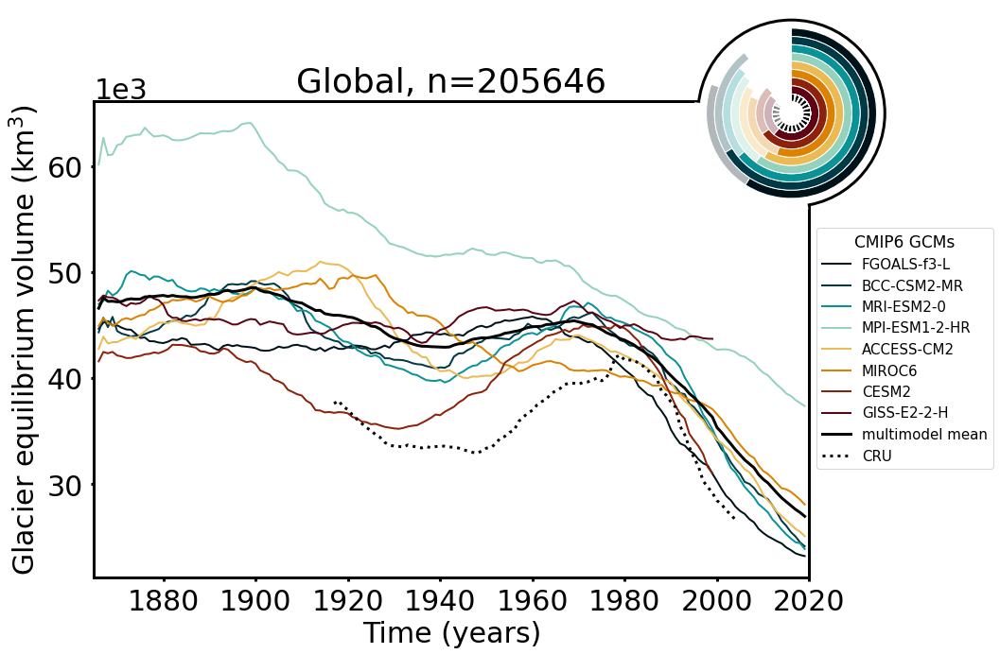

In [112]:
importlib.reload(plot_gcm)

fig = plt.figure(figsize=(15,10))
fig.patch.set_facecolor('white')
grid = plt.GridSpec(1,1,left=0.1,right=0.8, top=0.825)
ax = fig.add_subplot(grid[0])

ax=plot_gcm.plot_volume_km3(merge_sum,'global', itmix_df=itmix_df, itmix_df2=(itmix_df3+itmix_df2).fillna(0), n=str(merge_ds.rgi_id.shape[0]), ax=ax, add_legend=True,lw=2);
plt.savefig(os.path.join('out','run_CMIP6_geod','plots','global','interpolated','global_volume_km3_interpolated.png'),dpi=300)

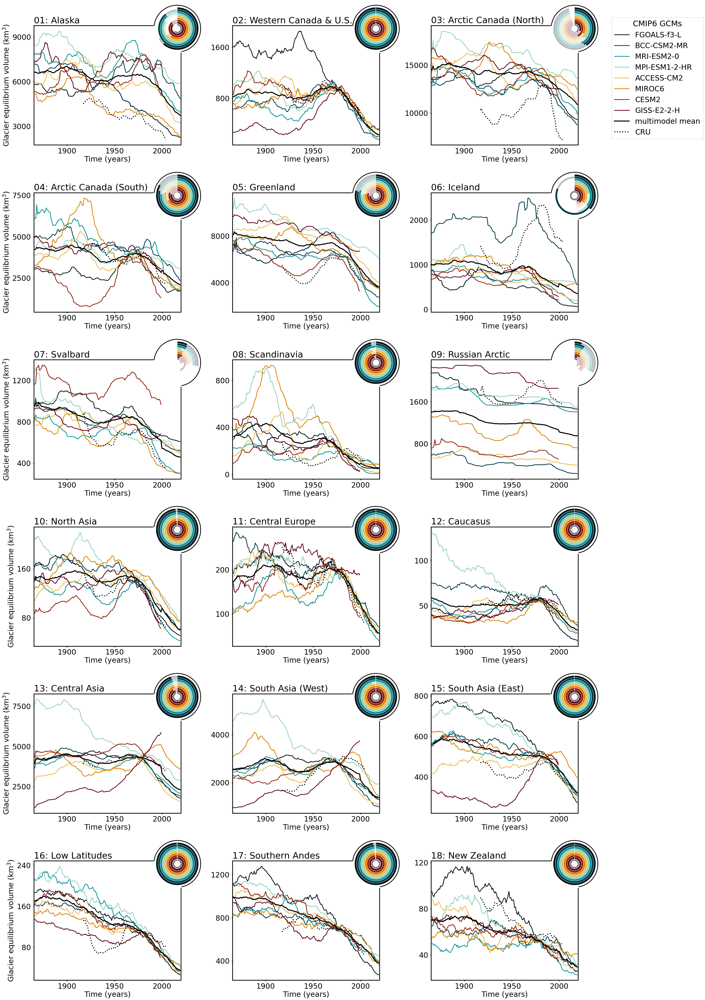

In [111]:
importlib.reload(plot_gcm)
plot_gcm.plot_regional_volume_km3_donut(merge_sum, itmix_df,itmix_df2=(itmix_df3+itmix_df2).fillna(0));

### convert to SSL

In [113]:
ds_i_dt = merge_sum-merge_sum.sel(year=1998).reindex(gcm=order)
sle_i_dt = convert_km3_to_sle(-ds_i_dt)

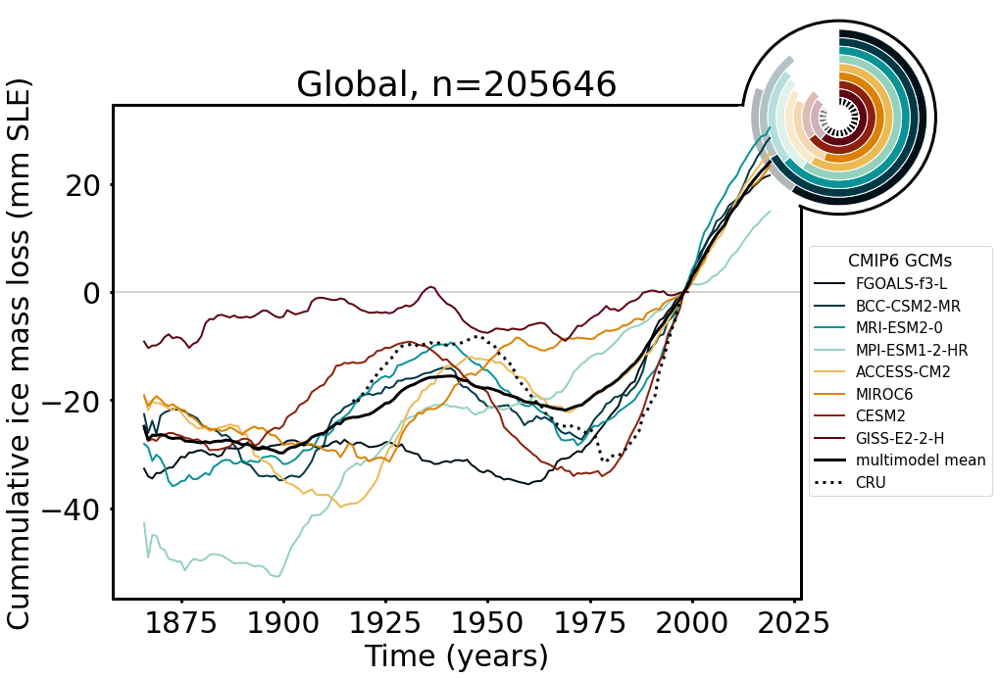

In [150]:
importlib.reload(plot_gcm)

fig = plt.figure(figsize=(15,10))
fig.patch.set_facecolor('white')
grid = plt.GridSpec(1,1,left=0.15,right=0.8, top=0.825)
ax = fig.add_subplot(grid[0])

plot_gcm.plot_mass_loss_sle(sle_i_dt, 'global', itmix_df=itmix_df, itmix_df2=(itmix_df3+itmix_df2).fillna(0), n=str(merge_ds.rgi_id.shape[0]), ax=ax, add_legend=True,lw=2);
plt.savefig(os.path.join('out','run_CMIP6_geod','plots','global','interpolated','global_sle_interpolated.png'),dpi=300)

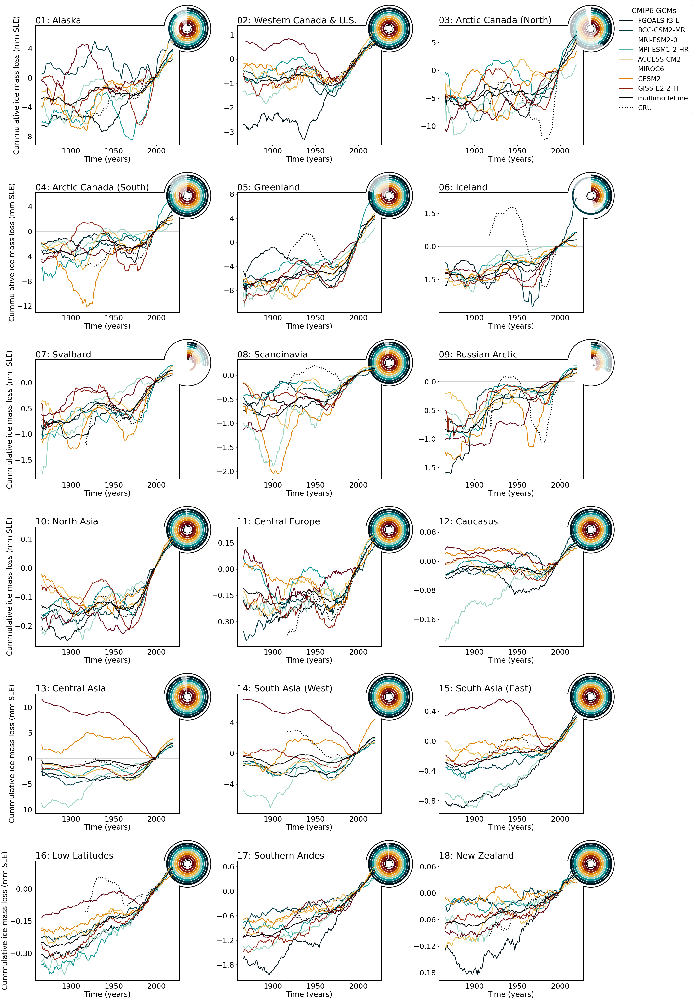

In [118]:
importlib.reload(plot_gcm)

fig = plt.figure(figsize=(40,60))
fig.patch.set_facecolor('white')
grid = plt.GridSpec(6,3, hspace=0.4, wspace=0.4,left=0.05,right=0.825,top=0.95,bottom=0.05)
    
for i,grid_index in enumerate(range(1,19)):
    reg = str(i+1).zfill(2)
    ax = fig.add_subplot(grid[grid_index-1])

    plot_gcm.plot_mass_loss_sle(sle_i_dt, reg, itmix_df=itmix_df, itmix_df2=(itmix_df3+itmix_df2).fillna(0), ax=ax, add_legend=False, lw=3)
    ax.yaxis.set_major_locator(MaxNLocator(5))
    if reg not in [str(i).zfill(2) for i in range(1,19,3)]:
        ax.set_ylabel('')

#legend
ax0 = fig.add_subplot(grid[2])
ax0, _= plot_gcm.show_legend(np.insert(ds.gcm.values,-1,'multimodel mean'), ax=ax0, bbox_to_anchor=(1.775,1.2), fontsize=27, lw=3);
ax0.set_axis_off()
plt.savefig(os.path.join('out','run_CMIP6_geod','plots','regional','interpolated','regional_sle_interpolated.pdf'),dpi=300)


### Error analysis 

In [119]:
count_df = pd.read_csv('failed.txt')
count_df = count_df.rename({'Unnamed: 0':'RGIId'},axis=1)
count_df.loc[:,'region']=count_df.RGIId.apply(lambda x:x[6:8])
count_df = count_df.set_index('RGIId')
count_df.loc[:,'vol']=itmix.vol_itmix_km3.loc[count_df.index]

In [144]:
perc = (count_df.loc[:,['border','CFL','region']].groupby(by='region').sum())
perc.loc['global'] =perc.sum()

total = all_ds.region.groupby('region').count().to_pandas()
total.loc['global']=total.sum()

vol=pd.DataFrame()
vol.loc[:,'border'] = count_df.loc[count_df[count_df.border].index].groupby('region').vol.sum()
vol.loc[:,'CFL'] =  count_df.loc[count_df[count_df.CFL].index].groupby('region').vol.sum()
vol.loc['global']= vol.sum()

vol_total = itmix.loc[all_ds.rgi_id,['vol_itmix_km3']]
vol_total.loc[:,'region']=vol_total.reset_index().RGIId.apply(lambda x: x[6:8]).values
vol_total = vol_total.groupby(by='region').sum()
vol_total.loc['global']= vol_total.sum()

In [143]:
vol_total = itmix.loc[all_ds.rgi_id,['vol_itmix_km3']]
vol_total.loc[:,'region']=vol_total.reset_index().RGIId.apply(lambda x: x[6:8]).values
vol_total.groupby(by='region').sum();

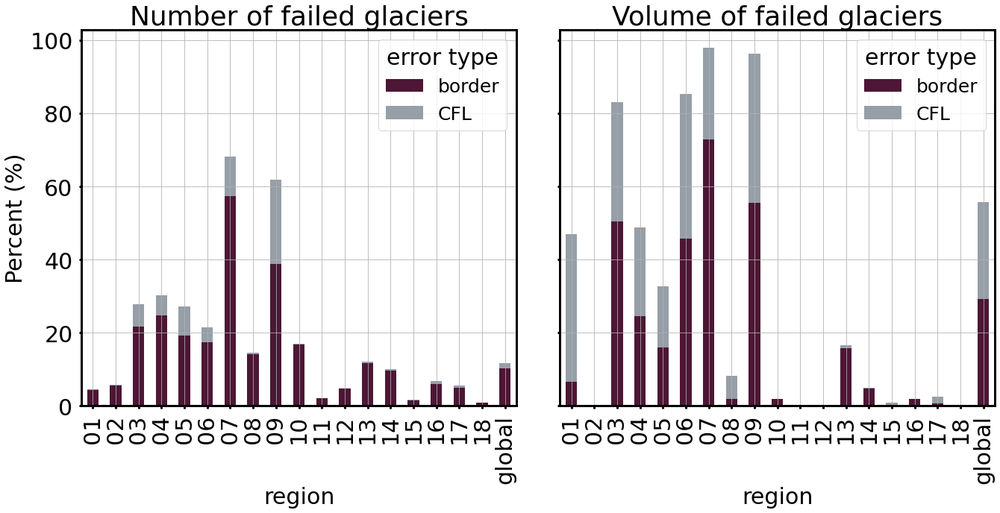

In [149]:
fig = plt.figure(figsize=(20,10))
fig.patch.set_facecolor('white')
grid = plt.GridSpec(1,2,wspace=0.1,left=0.1,right=0.95,top=0.9,bottom=0.2)
ax0 = fig.add_subplot(grid[0])
ax1 = fig.add_subplot(grid[1],sharey=ax0)

ax0.set_title('Number of failed glaciers')
(perc.div(total, axis=0)*100).plot.bar(ax=ax0,stacked=True, color=[[77/255,22/255,52/255,1],[150/255,159/255,167/255,1]])
ax0.set_ylabel('Percent (%)')
ax0.grid()
ax0.legend(title='error type',fontsize=25)

(vol.div(vol_total.vol_itmix_km3,axis=0)*100).plot.bar(ax=ax1,stacked=True, color=[[77/255,22/255,52/255,1],[150/255,159/255,167/255,1]])
ax1.grid()
ax1.set_title('Volume of failed glaciers')
ax1.legend(title='error type',fontsize=25)
plt.savefig(os.path.join('out','run_CMIP6_geod','plots','failed.png'),dpi=300);